In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import re
from pathlib import Path
from scipy.optimize import curve_fit


In [30]:


df_1 = pd.read_csv('CMC_measurement_summary_1.csv')
df_2 = pd.read_csv('CMC_measurement_summary_2.csv')
df_3 = pd.read_csv('CMC_measurement_summary_3.csv')

In [31]:
surfactant_library = {
    "SDS": {
        "full_name": "Sodium Dodecyl Sulfate",
        "CAS": "151-21-3",
        "CMC": 8.5,
        "Category": "anionic",
        "MW": 289.39,
        "stock_conc": 50,  # mM
    },


    "NaDC": {
        "full_name": "Sodium Docusate",
        "CAS": "577-11-7",
        "CMC": 5.3375,
        "Category": "anionic",
        "MW": 445.57,
        "stock_conc": 25,  # mM
    },

    
    "NaC": {
        "full_name": "Sodium Cholate",
        "CAS": "361-09-1",
        "CMC": 14,
        "Category": "anionic",
        "MW": 431.56,
        "stock_conc": 50,  # mM
    },


    "CTAB": {
        "full_name": "Hexadecyltrimethylammonium Bromide",
        "CAS": "57-09-0",
        "CMC": 1.07,
        "Category": "cationic",
        "MW": 364.45,
        "stock_conc": 5 # mM
    },


    "DTAB": {
        "full_name": "Dodecyltrimethylammonium Bromide",
        "CAS": "1119-94-4",
        "CMC": 15.85,
        "Category": "cationic",
        "MW": 308.34,
        "stock_conc": 50,  # mM
    },


    "TTAB": {
        "full_name": "Tetradecyltrimethylammonium Bromide",
        "CAS": "1119-97-7",
        "CMC": 3.985,
        "Category": "cationic",
        "MW": 336.39,
        "stock_conc": 50,  # mM
    },

    "CAPB": {
        "full_name": "Cocamidopropyl Betaine",
        "CAS": "61789-40-0",
        "CMC": 0.627,
        "Category": "zwitterionic",
        "MW": 342.52,
        "stock_conc": 50,  # mM
    },
    
    "CHAPS": {
        "full_name": "CHAPS",
        "CAS": "75621-03-3",
        "CMC": 8,
        "Category": "zwitterionic",
        "MW": 614.88,
        "stock_conc": 30,  # mM
    }
}

SURFACTANT_ORDER = ['SDS', 'NaDC', 'NaC', 'CTAB', 'DTAB', 'TTAB', 'CAPB', 'CHAPS']


In [32]:
df = pd.concat([df_1, df_2, df_3], ignore_index=True)
df

,Surfactant,Assay,Time_min,Replicate,CMC,r2,A1,A2,dx
0,SDS,a,0,1,8.882977,0.955758,0.818998,0.723942,0.362818
1,SDS,a,0,2,8.857474,0.966579,0.808444,0.721913,0.278352
2,SDS,a,0,3,8.854792,0.959431,0.796514,0.715391,0.192720
3,SDS,a,5,1,8.653676,0.939268,0.812191,0.717556,0.954561
4,SDS,a,5,2,8.798640,0.986328,0.804750,0.714567,0.424340
...,...,...,...,...,...,...,...,...,...
355,CHAPS,c,20,2,7.423887,0.999217,0.820636,0.649132,0.848638
356,CHAPS,c,20,3,7.298193,0.997990,0.818991,0.648450,0.887563
357,CHAPS,c,30,1,7.437734,0.996200,0.822079,0.651796,0.741612
358,CHAPS,c,30,2,7.439460,0.997761,0.818026,0.651655,0.696567


In [33]:
import pandas as pd
import numpy as np
import pingouin as pg

def compute_cv(x):
    """Coefficient of variation."""
    return x.std(ddof=1) / x.mean()

def analyze_reliability(df, value_col='CMC'):
    """
    Compute reliability metrics:
      • Between‑assay CV
      • Across‑time CV
      • Within‑replicate CV
      • ICC of replicates
      • Cronbach's alpha of replicates
    Returns a DataFrame of metrics per Surfactant and overall.
    """
    results = []

    def surf_metrics(df_s, label):
        assay_means = df_s.groupby('Assay')[value_col].mean()
        cv_assay = compute_cv(assay_means)

        time_means = df_s.groupby('Time_min')[value_col].mean()
        cv_time = compute_cv(time_means)

        rep_cvs = df_s.groupby(['Assay', 'Time_min'])[value_col].apply(compute_cv)
        mean_rep_cv = rep_cvs.mean()

        icc_df = pg.intraclass_corr(data=df_s,
                                    targets='Assay',
                                    raters='Replicate',
                                    ratings=value_col)
        icc2 = icc_df.loc[icc_df['Type']=='ICC2', 'ICC'].values
        icc2 = icc2[0] if len(icc2) else np.nan

        pivot = df_s.pivot_table(index=['Assay', 'Time_min'],
                                 columns='Replicate',
                                 values=value_col)
        pivot_clean = pivot.dropna(axis=0, how='any')
        alpha = pg.cronbach_alpha(pivot_clean)[0] if not pivot_clean.empty else np.nan

        return {
            'Label': label,
            'CV_assay': cv_assay,
            'CV_time': cv_time,
            'Mean_rep_CV': mean_rep_cv,
            'ICC2_replicates': icc2,
            'Cronbach_alpha': alpha
        }

    for surf in df['Surfactant'].unique():
        results.append(surf_metrics(df[df['Surfactant']==surf], surf))
    results.append(surf_metrics(df, 'ALL'))

    return pd.DataFrame(results)


def interpret_metrics(row):
    """Generate human-readable conclusions from metrics row."""
    concl = []
    # Assay variability
    if row['CV_assay'] < 0.1:
        concl.append('Low assay-to-assay variability')
    elif row['CV_assay'] < 0.2:
        concl.append('Moderate assay-to-assay variability')
    else:
        concl.append('High assay-to-assay variability')
    # Time variability
    if row['CV_time'] < 0.1:
        concl.append('Stable measurements over time')
    elif row['CV_time'] < 0.2:
        concl.append('Moderate drift over time')
    else:
        concl.append('Significant drift over time')
    # Replicate variability
    if row['Mean_rep_CV'] < 0.05:
        concl.append('Excellent consistency among replicates')
    elif row['Mean_rep_CV'] < 0.1:
        concl.append('Good consistency among replicates')
    else:
        concl.append('Poor consistency among replicates')
    # ICC
    if row['ICC2_replicates'] > 0.75:
        concl.append('High absolute agreement (ICC2)')
    elif row['ICC2_replicates'] > 0.5:
        concl.append('Moderate agreement (ICC2)')
    else:
        concl.append('Low agreement (ICC2)')
    # Cronbach's alpha
    if row['Cronbach_alpha'] > 0.9:
        concl.append("Excellent internal consistency (α)")
    elif row['Cronbach_alpha'] > 0.7:
        concl.append("Acceptable internal consistency (α)")
    else:
        concl.append("Questionable internal consistency (α)")

    return '; '.join(concl)


if __name__ == '__main__':
    # Load data

    metrics = analyze_reliability(df, value_col='CMC')
    # Print metrics table
    print(metrics.to_string(index=False))
    # Print conclusions
    for _, row in metrics.iterrows():
        print(f"\nConclusions for {row['Label']}: \n  {interpret_metrics(row)}")


Label   CV_assay    CV_time  Mean_rep_CV  ICC2_replicates  Cronbach_alpha
  SDS   0.015609   0.012713     0.018879         0.185314        0.487276
 NaDC   0.010470   0.004369     0.013599         0.930403        0.351424
  NaC   0.036196   0.008567     0.028201         0.842601        0.778472
 CTAB   0.056141   0.016043     0.019625         0.953930        0.938169
 DTAB   0.009678   0.025852     0.025588         0.015004        0.604428
 TTAB   0.018721   0.018971     0.014657         0.941303        0.837926
 CAPB -58.607774 -36.379161    -0.477105         0.912283        0.886438
CHAPS   0.085862   0.013824     0.028074         0.983624        0.938054
  ALL   0.012181   0.017705     0.783096         0.579032        0.764690

Conclusions for SDS: 
  Low assay-to-assay variability; Stable measurements over time; Excellent consistency among replicates; Low agreement (ICC2); Questionable internal consistency (α)

Conclusions for NaDC: 
  Low assay-to-assay variability; Stable measure

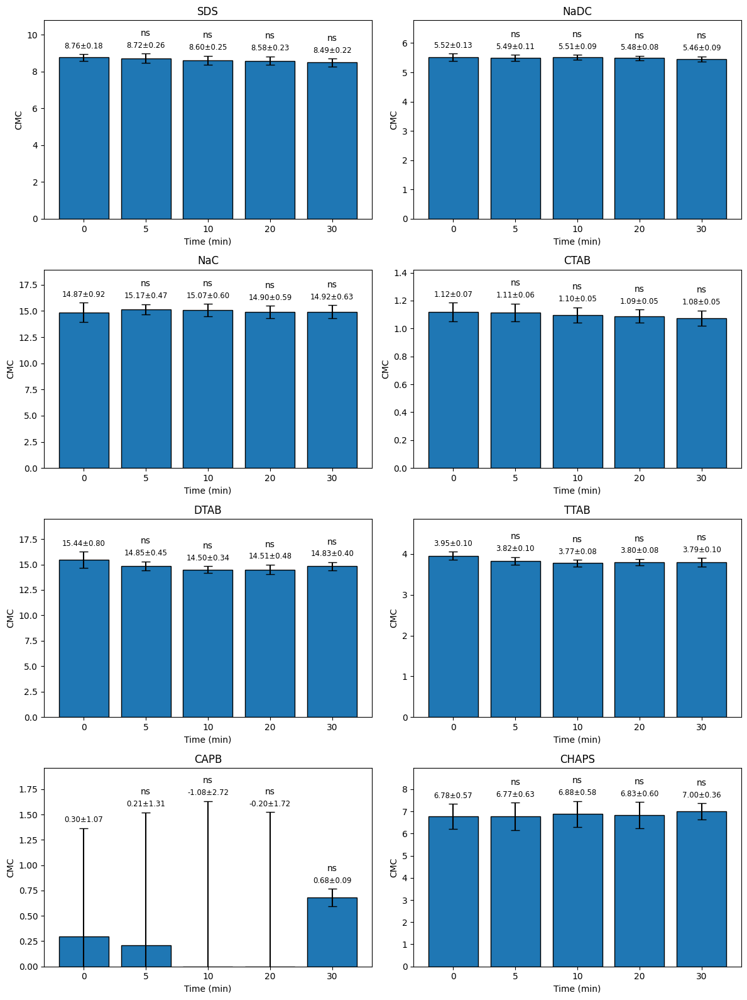

In [34]:
def bar(surfactant, ax, alpha_levels=(0.05, 0.01, 0.001)):

    # filter data
    subset = df[df['Surfactant'] == surfactant]
    # get raw values by time
    groups = subset.groupby('Time_min')['CMC'].apply(list).to_dict()
    # compute stats
    stats_df = (
        subset
        .groupby('Time_min')['CMC']
        .agg(['mean', 'std'])
        .reset_index()
        .sort_values('Time_min')
    )

    # categorical x
    x_labels = stats_df['Time_min'].astype(str).tolist()
    x = list(range(len(x_labels)))

    # plot bars
    ax.bar(
        x,
        stats_df['mean'],
        yerr=stats_df['std'],
        capsize=5,
        edgecolor='black'
    )

    # set y‐limit
    ymax = (stats_df['mean'] + stats_df['std']).max() * 1.2
    ax.set_ylim(0, ymax)
    pad = ymax * 0.02

    # annotate mean±std
    for i, row in stats_df.iterrows():
        m, s = row['mean'], row['std']
        ax.text(
            x[i],
            m + s + pad,
            f"{m:.2f}±{s:.2f}",
            ha='center',
            va='bottom',
            fontsize='small'
        )

    # perform and annotate significance vs 0 min for every non-zero time
    baseline = groups.get(0, [])
    for i, t in enumerate(stats_df['Time_min']):
        if t == 0:
            continue
        comp = groups.get(t, [])
        if len(baseline) == 3 and len(comp) == 3:
            p = stats.ttest_ind(baseline, comp, equal_var=False).pvalue
            if p < alpha_levels[2]:
                stars = '***'
            elif p < alpha_levels[1]:
                stars = '**'
            elif p < alpha_levels[0]:
                stars = '*'
            else:
                stars = 'ns'
        else:
            stars = 'ns'

        # annotation position
        bar_top = stats_df.loc[stats_df['Time_min']==t, 'mean'].values[0] \
                  + stats_df.loc[stats_df['Time_min']==t, 'std'].values[0]
        ax.text(
            x[i],
            bar_top + pad * 4,
            stars,
            ha='center',
            va='bottom',
            fontsize='medium'
        )

    # finalize axes
    ax.set_xticks(x)
    ax.set_xticklabels(x_labels)
    ax.set_xlabel('Time (min)')
    ax.set_ylabel('CMC')
    ax.set_title(surfactant)


# Example usage: 4×2 grid
surfactants = df['Surfactant'].unique()

fig, axes = plt.subplots(4, 2, figsize=(12, 16), sharey=False)

for ax, surf in zip(axes.flatten(), surfactants):
    bar(surf, ax)

plt.tight_layout()
fig.savefig('CMC_vs_time.png', dpi=300)
plt.show()


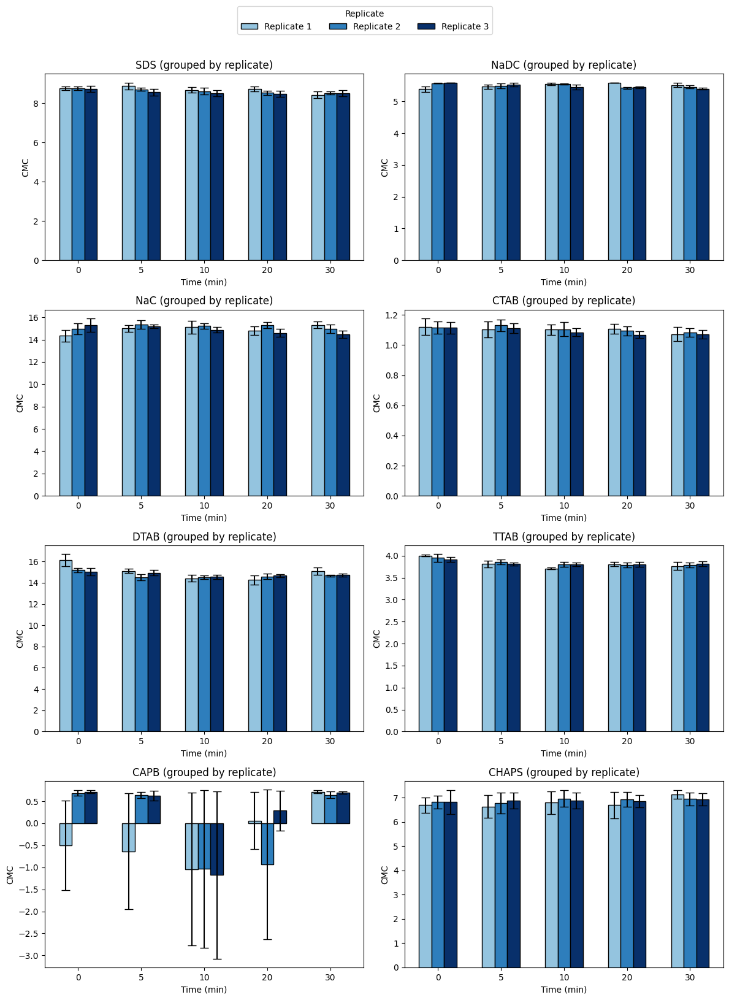

In [35]:
import numpy as np
import matplotlib.pyplot as plt

import numpy as np
import matplotlib.pyplot as plt

def bar_n3(surfactant, ax, group_by='Replicate', cmap_name='Blues'):
    """
    Plots CMC vs time for a single surfactant, grouped either by 'Replicate' or by 'Assay'.
    
    Parameters
    ----------
    surfactant : str
        Name of the surfactant to filter on.
    ax : matplotlib.axes.Axes
        The Axes to draw on.
    group_by : {'Replicate', 'Assay'}
        Which column to use for splitting the bars.
    cmap_name : str
        Matplotlib colormap name for coloring the groups.
    """
    # filter data
    subset = df[df['Surfactant'] == surfactant]
    
    # compute mean and SEM for each (Time_min, group_by)
    grouped     = subset.groupby(['Time_min', group_by])['CMC']
    pivot_mean  = grouped.mean().unstack()   # rows=Time_min, cols=group_by
    pivot_sem   = grouped.sem().unstack()    # same shape, SEM
    
    # sorted time points and grouping values
    time_points  = np.array(sorted(pivot_mean.index))
    group_values = sorted(pivot_mean.columns)
    n = len(group_values)

    # generate colors
    cmap   = plt.get_cmap(cmap_name)
    colors = cmap(np.linspace(0.4, 1.0, n))

    # bar layout
    group_width = 0.6
    width       = group_width / n
    x           = np.arange(len(time_points))

    # plot each group
    for i, grp in enumerate(group_values):
        vals = pivot_mean[grp].reindex(time_points).values
        errs = pivot_sem [grp].reindex(time_points).values
        mask = ~np.isnan(vals)
        
        offsets = x - group_width/2 + i*width + width/2
        
        ax.bar(
            offsets[mask],
            vals   [mask],
            width=width,
            color=colors[i],
            edgecolor='black',
            label=f"{group_by} {grp}",
            yerr=errs[mask],
            capsize=5
        )

    # labels & title
    ax.set_xticks(x)
    ax.set_xticklabels([str(t) for t in time_points])
    ax.set_xlabel('Time (min)')
    ax.set_ylabel('CMC')
    ax.set_title(f"{surfactant} (grouped by {group_by.lower()})")



# Example usage: plot all surfactants in a 4×2 grid with a single legend at top
surfactants = df['Surfactant'].unique()
fig, axes = plt.subplots(4, 2, figsize=(12, 16), sharey=False)
for ax, surf in zip(axes.flatten(), surfactants):
    bar_n3(surf, ax, group_by='Replicate')

# create a single legend above all subplots
handles, labels = axes.flatten()[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Replicate', ncol=3, loc='upper center', bbox_to_anchor=(0.5, 1.02))

plt.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig('CMC_vs_time_replicates.png', dpi=300)
plt.show()


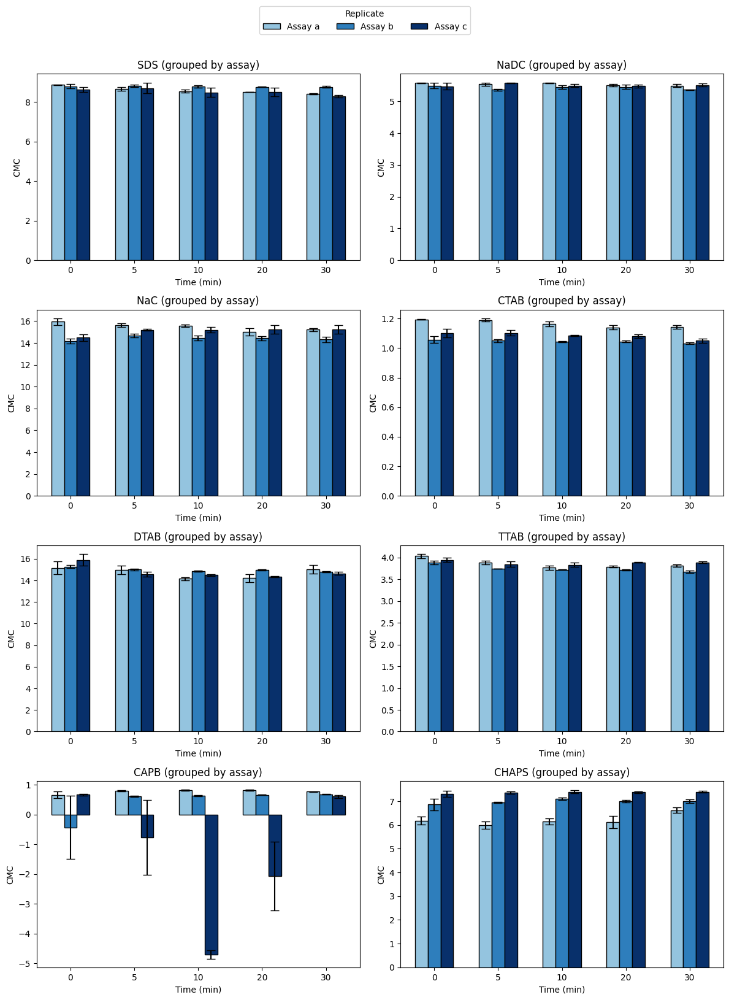

In [36]:

# Example usage: plot all surfactants in a 4×2 grid with a single legend at top
surfactants = df['Surfactant'].unique()
fig, axes = plt.subplots(4, 2, figsize=(12, 16), sharey=False)
for ax, surf in zip(axes.flatten(), surfactants):
    bar_n3(surf, ax, group_by='Assay')

# create a single legend above all subplots
handles, labels = axes.flatten()[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Replicate', ncol=3, loc='upper center', bbox_to_anchor=(0.5, 1.02))

plt.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig('CMC_vs_time_replicates.png', dpi=300)
plt.show()

In [52]:
base_dirs = ['20250702_1723', '20250703_1657', '20250704_1309']

pattern = re.compile(
    r'^(?P<prefix>output_data|wellplate_data)_'  
    r'[^_]+_[^_]+'                              
    r'_(?P<surfactant>[^_]+)'                   
    r'_(?P<time>\d+)min_[^_]+_'                 
    r'rep(?P<replicate>\d+)\.csv$'              
)

# 1) Read & combine output_data
out_dfs = []
for base in base_dirs:
    for path in (Path(base) / 'raw_data').glob('output_data_*.csv'):
        m = pattern.match(path.name)
        if not m:
            continue
        surf = m.group('surfactant')
        t    = int(m.group('time'))
        rep  = int(m.group('replicate'))

        df = pd.read_csv(path, usecols=['334_373', '334_384'])
        df['ratio']      = df['334_373'] / df['334_384']
        df['surfactant'] = surf
        df['time']        = t
        df['replicate']   = rep
        out_dfs.append(df)

combined_raw = pd.concat(out_dfs, ignore_index=True)

# give each measurement a “row-within-group” index
combined_raw['well_idx'] = (
    combined_raw
      .groupby(['surfactant','time','replicate'])
      .cumcount()
)

# 2) Read & combine wellplate_data (no averaging!)
well_dfs = []
for base in base_dirs:
    for path in (Path(base) / 'raw_data').glob('wellplate_data_*.csv'):
        m = pattern.match(path.name)
        if not m:
            continue
        surf = m.group('surfactant')
        t    = int(m.group('time'))
        rep  = int(m.group('replicate'))

        wdf = pd.read_csv(path, usecols=['concentration'])
        wdf['surfactant'] = surf
        wdf['time']        = t
        wdf['replicate']   = rep
        well_dfs.append(wdf)

well_meta = pd.concat(well_dfs, ignore_index=True)

# also give each concentration row an index
well_meta['well_idx'] = (
    well_meta
      .groupby(['surfactant','time','replicate'])
      .cumcount()
)

# 3) Merge on the four keys: surfactant, time, replicate, and well_idx
combined_full = pd.merge(
    combined_raw,
    well_meta,
    on=['surfactant','time','replicate','well_idx'],
    how='left'
).drop(columns='well_idx')


In [53]:
import re
from pathlib import Path
import pandas as pd

# directories to process
base_dirs = ['20250702_1723', '20250703_1657', '20250704_1309']

# updated pattern to capture 'assay' field
pattern = re.compile(
    r'^(?P<prefix>output_data|wellplate_data)_'   # file type
    r'[^_]+_[^_]+'                               # two arbitrary fields
    r'_(?P<surfactant>[^_]+)'                    # surfactant
    r'_(?P<time>\d+)min_'                       # time in minutes
    r'(?P<assay>[^_]+)'                          # assay identifier
    r'_rep(?P<replicate>\d+)\.csv$'            # replicate
)

# 1) Read & combine output_data (with assay)
out_dfs = []
for base in base_dirs:
    raw_dir = Path(base) / 'raw_data'
    for path in raw_dir.glob('output_data_*.csv'):
        m = pattern.match(path.name)
        if not m:
            continue
        surf = m.group('surfactant')
        time_min = int(m.group('time'))
        assay = m.group('assay')
        rep = int(m.group('replicate'))

        df = pd.read_csv(path, usecols=['334_373', '334_384'])
        df['ratio'] = df['334_373'] / df['334_384']
        df['surfactant'] = surf
        df['time'] = time_min
        df['assay'] = assay
        df['replicate'] = rep
        out_dfs.append(df)

combined_raw = pd.concat(out_dfs, ignore_index=True)

# assign well index per group including assay
combined_raw['well_idx'] = (
    combined_raw
      .groupby(['surfactant', 'time', 'assay', 'replicate'])
      .cumcount()
)

# 2) Read & combine wellplate_data (with assay, no averaging)
well_dfs = []
for base in base_dirs:
    raw_dir = Path(base) / 'raw_data'
    for path in raw_dir.glob('wellplate_data_*.csv'):
        m = pattern.match(path.name)
        if not m:
            continue
        surf = m.group('surfactant')
        time_min = int(m.group('time'))
        assay = m.group('assay')
        rep = int(m.group('replicate'))

        wdf = pd.read_csv(path, usecols=['concentration'])
        wdf['surfactant'] = surf
        wdf['time'] = time_min
        wdf['assay'] = assay
        wdf['replicate'] = rep
        well_dfs.append(wdf)

well_meta = pd.concat(well_dfs, ignore_index=True)

# assign well index per group including assay
well_meta['well_idx'] = (
    well_meta
      .groupby(['surfactant', 'time', 'assay', 'replicate'])
      .cumcount()
)

# 3) Merge on surfactant, time, assay, replicate, and well_idx
combined_full = pd.merge(
    combined_raw,
    well_meta,
    on=['surfactant', 'time', 'assay', 'replicate', 'well_idx'],
    how='left'
).drop(columns='well_idx')

# combined_full now includes columns: 334_373, 334_384, ratio, surfactant, time, assay, replicate, concentration
print(combined_full.head())


    334_373   334_384     ratio surfactant  time assay  replicate  \
0  133296.0  167994.0  0.793457       NaDC     5     b          3   
1  121709.0  150630.0  0.808000       NaDC     5     b          3   
2  143249.0  175407.0  0.816666       NaDC     5     b          3   
3  153011.0  181410.0  0.843454       NaDC     5     b          3   
4  117571.0  146014.0  0.805204       NaDC     5     b          3   

   concentration  
0       2.135000  
1       2.756273  
2       3.558333  
3       4.003125  
4       4.536875  


In [67]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import math

# Desired plotting order for surfactants
SURFACTANT_ORDER = ['SDS', 'NaDC', 'NaC', 'CTAB', 'DTAB', 'TTAB', 'CAPB', 'CHAPS']

def boltzmann(x, A1, A2, x0, dx):
    """Boltzmann sigmoidal function."""
    return A2 + (A1 - A2) / (1 + np.exp((x - x0) / dx))


def CMC_plot(ax, ratio, conc_original):
    """Fit data, plot points+curve, and return (CMC, R2)."""
    # initial guess
    conc = np.log(conc_original)
    p0 = [
        max(ratio),
        min(ratio),
        (max(conc) + min(conc)) / 2,
        (max(conc) - min(conc)) / 5
    ]
    popt, _ = curve_fit(boltzmann, conc, ratio, p0, maxfev=5000)

    # lower_bounds = [
    #     0.0,               # A1 ≥ 0.0
    #     0.0,               # A2 ≥ 0.0
    #     0.0,               # x0/CMC ≥ 0.0
    #     0.0                # dx ≥ 0
    # ]
    # upper_bounds = [
    #     1.0,               # A1 ≤ 1.0
    #     1.0,               # A2 ≤ 1.0
    #     max(conc),         # CMC ≤ max concentration
    #     np.inf                  # dx ≤ inf
    # ]

    # popt, pcov = curve_fit(
    #     boltzmann,
    #     conc, ratio,
    #     p0=p0,
    #     bounds=(lower_bounds, upper_bounds),
    #     maxfev=5000
    # )
    A1, A2, cmc, dx = popt

    x0 = math.exp(cmc)  # convert back to original concentration scale

    # compute R²
    residuals = ratio - boltzmann(conc, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((ratio - np.mean(ratio))**2)
    r2 = 1 - ss_res / ss_tot

    # plot data + fit curve
    x_fit = np.linspace(min(conc), max(conc), 200)
    ax.scatter(conc, ratio, s=20)
    ax.plot(x_fit, boltzmann(x_fit, *popt), lw=1)
    ax.axvline(cmc, linestyle='--')

    # annotate in upper right
    ax.text(
        0.95, 0.95,
        f"CMC = {x0:.2f}\n$R^2$ = {r2:.3f}",
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=8,
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.7)
    )

    return x0, r2


def plot_cmc(combined_raw, layout='surf_time'):
    """
    Plot CMC fits.  
    layout = 'surf_time' : rows=surfactants, cols=times  
    layout = 'replicate' : rows=surfactant-time combos, cols=replicates  
    layout = 'assay'     : rows=surfactant-time-replicate combos, cols=assays
    """
    if layout == 'surf_time':
        surfs_present = [s for s in SURFACTANT_ORDER if s in combined_raw['surfactant'].unique()]
        times = sorted(combined_raw['time'].unique())
        nrows, ncols = len(surfs_present), len(times)
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(4*ncols, 3*nrows),
                                 squeeze=False)
        for i, surf in enumerate(surfs_present):
            for j, t in enumerate(times):
                ax = axes[i][j]
                df = combined_raw[(combined_raw['surfactant']==surf) & (combined_raw['time']==t)]
                if not df.empty:
                    CMC_plot(ax, df['ratio'].values, df['concentration'].values)
                if i == 0:
                    ax.set_title(f"{t} min")
                if j == 0:
                    ax.set_ylabel(surf)

    elif layout == 'replicate':
        reps = sorted(combined_raw['replicate'].unique())
        surfs_present = [s for s in SURFACTANT_ORDER if s in combined_raw['surfactant'].unique()]
        times = sorted(combined_raw['time'].unique())
        combos = [(surf, t) for surf in surfs_present for t in times]
        nrows, ncols = len(combos), len(reps)
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(4*ncols, 3*nrows),
                                 squeeze=False)
        for i, (surf, t) in enumerate(combos):
            for j, r in enumerate(reps):
                ax = axes[i][j]
                df = combined_raw[(combined_raw['surfactant']==surf) & (combined_raw['time']==t) & (combined_raw['replicate']==r)]
                if not df.empty:
                    CMC_plot(ax, df['ratio'].values, df['concentration'].values)
                if j == 0:
                    ax.set_ylabel(f"{surf}, {t} min")
                if i == 0:
                    ax.set_title(f"Rep {r}")

    elif layout == 'assay':
        reps = sorted(combined_raw['assay'].unique())
        surfs_present = [s for s in SURFACTANT_ORDER if s in combined_raw['surfactant'].unique()]
        times = sorted(combined_raw['time'].unique())
        combos = [(surf, t) for surf in surfs_present for t in times]
        nrows, ncols = len(combos), len(reps)
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(4*ncols, 3*nrows),
                                 squeeze=False)
        for i, (surf, t) in enumerate(combos):
            for j, r in enumerate(reps):
                ax = axes[i][j]
                df = combined_raw[(combined_raw['surfactant']==surf) & (combined_raw['time']==t) & (combined_raw['assay']==r)]
                if not df.empty:
                    CMC_plot(ax, df['ratio'].values, df['concentration'].values)
                if j == 0:
                    ax.set_ylabel(f"{surf}, {t} min")
                if i == 0:
                    ax.set_title(f"Assay {r}")

    elif layout == 'assay-replicate':
        assays = sorted(combined_raw['assay'].unique())
        surfs_present = [s for s in SURFACTANT_ORDER if s in combined_raw['surfactant'].unique()]
        times = sorted(combined_raw['time'].unique())
        reps = sorted(combined_raw['replicate'].unique())
        combos = [(surf, t, r) for surf in surfs_present for t in times for r in reps]
        nrows, ncols = len(combos), len(assays)
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(4*ncols, 3*nrows),
                                 squeeze=False)
        for i, (surf, t, r) in enumerate(combos):
            for j, assay in enumerate(assays):
                ax = axes[i][j]
                df = combined_raw[(combined_raw['surfactant']==surf) & (combined_raw['time']==t) &
                                  (combined_raw['replicate']==r) & (combined_raw['assay']==assay)]
                if not df.empty:
                    CMC_plot(ax, df['ratio'].values, df['concentration'].values)
                if j == 0:
                    ax.set_ylabel(f"{surf}, {t} min, rep {r}")
                if i == 0:
                    ax.set_title(f"Assay {assay}")

    else:
        raise ValueError("layout must be 'surf_time', 'replicate', or 'assay'")

    # common labels
    fig.text(0.5, 0.04, 'Surfactant Concentration (mM)', ha='center')
    fig.text(0.06, 0.5, 'I₁/I₃ Ratio', va='center', rotation='vertical')

    plt.tight_layout(rect=[0.05, 0.05, 1, 1])

    #plt.savefig(f'CMC_plot_{layout}.png', dpi=300)
    plt.savefig(f'CMC_plot_{layout}.pdf')

    plt.show()


/var/folders/hk/7jjnrbrj53n1t8_bmkhf0_k00000gn/T/ipykernel_56843/4248673445.py:24: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(boltzmann, conc, ratio, p0, maxfev=5000)


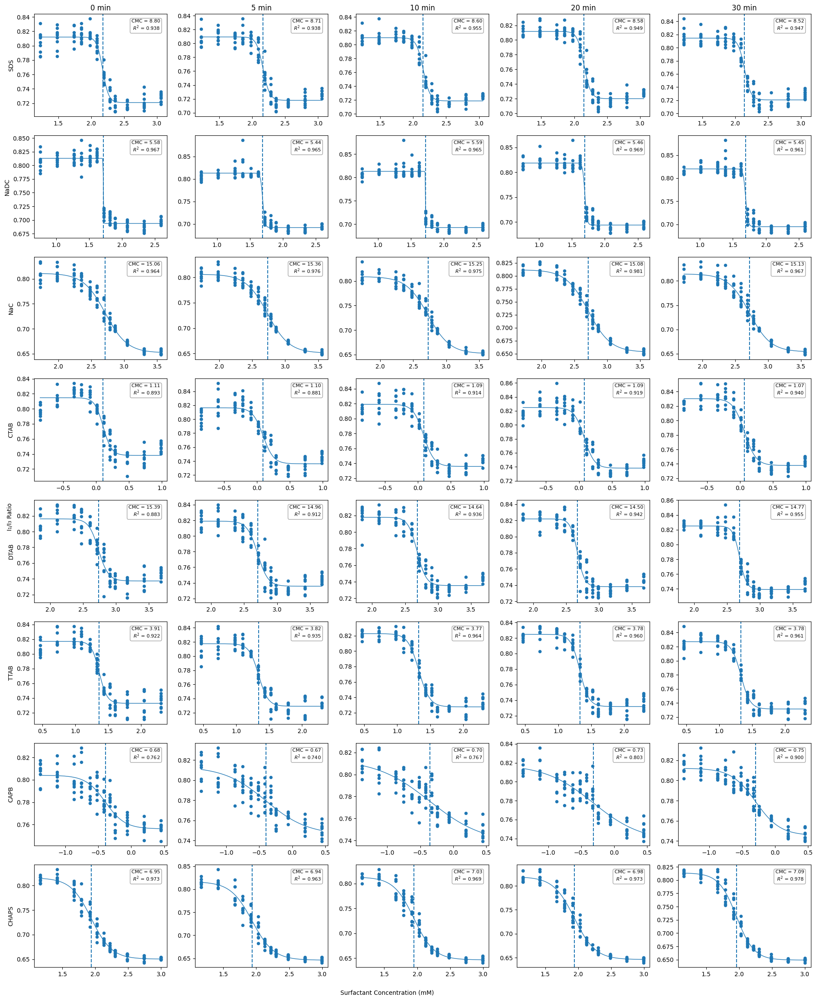

In [68]:
plot_cmc(combined_full, layout='surf_time')



/var/folders/hk/7jjnrbrj53n1t8_bmkhf0_k00000gn/T/ipykernel_56843/4248673445.py:11: RuntimeWarning: overflow encountered in exp
  return A2 + (A1 - A2) / (1 + np.exp((x - x0) / dx))


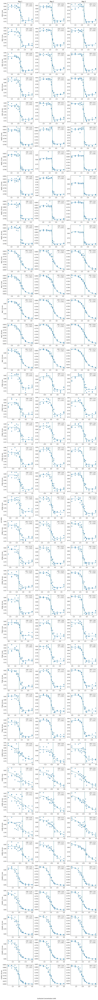

In [69]:
plot_cmc(combined_full, layout='replicate')

/var/folders/hk/7jjnrbrj53n1t8_bmkhf0_k00000gn/T/ipykernel_56843/633941939.py:11: RuntimeWarning: overflow encountered in exp
  return A2 + (A1 - A2) / (1 + np.exp((x - x0) / dx))


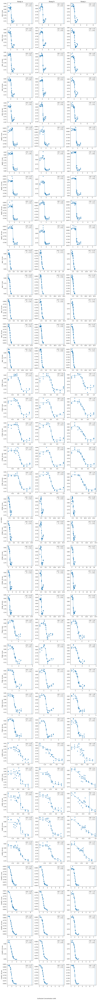

In [61]:
plot_cmc(combined_full, layout='assay')


/var/folders/hk/7jjnrbrj53n1t8_bmkhf0_k00000gn/T/ipykernel_56843/633941939.py:11: RuntimeWarning: overflow encountered in exp
  return A2 + (A1 - A2) / (1 + np.exp((x - x0) / dx))
/var/folders/hk/7jjnrbrj53n1t8_bmkhf0_k00000gn/T/ipykernel_56843/633941939.py:24: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(boltzmann, conc, ratio, p0, maxfev=5000)


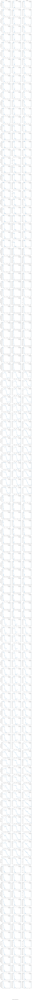

In [62]:
plot_cmc(combined_full, layout='assay-replicate')

In [ ]:
combined_full

,334_373,334_384,ratio,surfactant,time,assay,replicate,concentration
0,133296.0,167994.0,0.793457,NaDC,5,b,3,2.135000
1,121709.0,150630.0,0.808000,NaDC,5,b,3,2.756273
2,143249.0,175407.0,0.816666,NaDC,5,b,3,3.558333
3,153011.0,181410.0,0.843454,NaDC,5,b,3,4.003125
4,117571.0,146014.0,0.805204,NaDC,5,b,3,4.536875
...,...,...,...,...,...,...,...,...
4315,201879.0,301759.0,0.669007,CHAPS,20,c,2,9.200000
4316,221422.0,335694.0,0.659595,CHAPS,20,c,2,10.000000
4317,232806.0,358632.0,0.649150,CHAPS,20,c,2,12.000000
4318,228839.0,353533.0,0.647292,CHAPS,20,c,2,15.491933


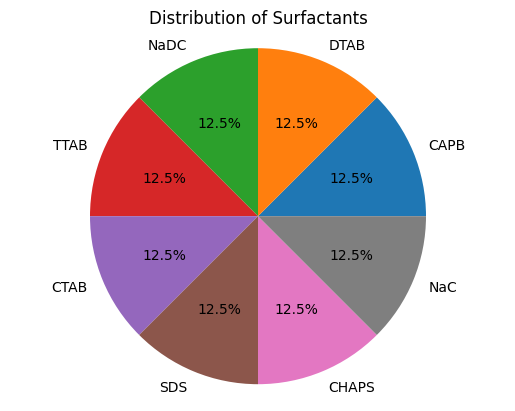

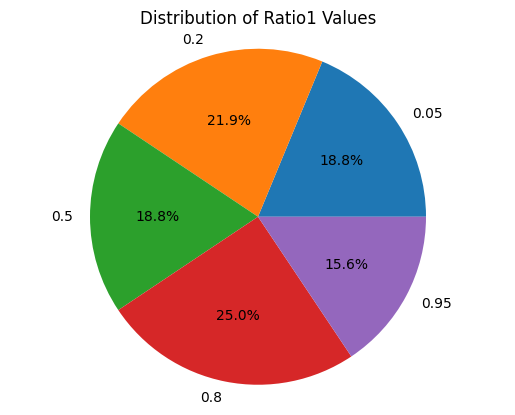

In [1]:
import random
import pandas as pd
import matplotlib.pyplot as plt
from itertools import combinations

# Define surfactant categories
surfactant_library = {
    "SDS": "anionic",
    "NaDC": "anionic",
    "NaC": "anionic",
    "CTAB": "cationic",
    "DTAB": "cationic",
    "TTAB": "cationic",
    "CAPB": "zwitterionic",
    "CHAPS": "zwitterionic"
}

# Ratios for surfactant1
ratios = [0.05, 0.2, 0.5, 0.8, 0.95]

random.seed(20250708)

# Build all valid binary combos (exclude cationic-anionic)
keys = list(surfactant_library.keys())
all_combos = [
    (s1, s2, r)
    for s1, s2 in combinations(keys, 2)
    if not (
        (surfactant_library[s1] == 'cationic' and surfactant_library[s2] == 'anionic') or
        (surfactant_library[s1] == 'anionic' and surfactant_library[s2] == 'cationic')
    )
    for r in ratios
]

# Stratified sampling: each surfactant appears exactly 8 times (32 mixes × 2 slots = 64 total slots)
target = 8
counts = {s: 0 for s in keys}
selected = []


# Attempt selection loop with backtracking on failure
while len(selected) < 32:
    # Filter combos where both surfactants have slots remaining
    eligible = [
        combo for combo in all_combos
        if combo not in selected
        and counts[combo[0]] < target
        and counts[combo[1]] < target
    ]
    if not eligible:
        # Reset if stuck
        selected = []
        counts = {s: 0 for s in keys}
        continue
    pick = random.choice(eligible)
    selected.append(pick)
    counts[pick[0]] += 1
    counts[pick[1]] += 1

# Create DataFrame
df = pd.DataFrame(selected, columns=['Surfactant1', 'Surfactant2', 'Ratio1'])
df['Ratio2'] = 1 - df['Ratio1']

df[['Ratio1', 'Ratio2']] = round(df[['Ratio1', 'Ratio2']],2)

# Pie chart for surfactant distribution
occurrences = pd.Series(df['Surfactant1'].tolist() + df['Surfactant2'].tolist()).value_counts()
plt.figure()
plt.pie(occurrences.values, labels=occurrences.index, autopct='%1.1f%%')
plt.title('Distribution of Surfactants')
plt.axis('equal')
plt.show()

# Pie chart for ratio distribution
plt.figure()
ratio_dist = df['Ratio1'].value_counts().sort_index()
plt.pie(ratio_dist.values, labels=ratio_dist.index.astype(str), autopct='%1.1f%%')
plt.title('Distribution of Ratio1 Values')
plt.axis('equal')
plt.show()

In [2]:
df.to_csv('selected_surfactant_combinations.csv', index=False)

In [11]:
import pandas as pd
import itertools

surfactant_library = {
    "SDS": "anionic",
    "NaDC": "anionic",
    "NaC": "anionic",
    "CTAB": "cationic",
    "DTAB": "cationic",
    "TTAB": "cationic",
    "CAPB": "zwitterionic",
    "CHAPS": "zwitterionic"
}

# Generate all binary combinations of surfactants
combinations = list(itertools.combinations(surfactant_library.keys(), 2))

# Build dataframe rows
data = []
for s1, s2 in combinations:
    type1 = surfactant_library[s1]
    type2 = surfactant_library[s2]
    # Sort the types for consistent naming like "anionic-cationic"
    combo_type = '-'.join(sorted([type1, type2]))
    data.append((s1, s2, combo_type))

# Create dataframe
df = pd.DataFrame(data, columns=["surfactant_1", "surfactant_2", "combination"])
df = df[(df['combination'] != 'cationic-anionic') & (df['combination'] != 'anionic-cationic')]
df.to_csv('possible_surfactant_combinations.csv', index=False)